In [31]:
import os
import numpy as np
from PIL import Image, ImageFile
from skimage import io
import matplotlib.pyplot as plt
import tifffile
from scipy import misc
from tifffile import TiffFile
from tifffile.tifffile import TIFF_DECOMPESSORS
from visualization import ids_to_greyscale, load_depth, show_bounding_boxes, load_stencil_ids, load_stencil_flags

In [4]:
# name = '2017-12-13--17-39-37--326'
# name = '2017-11-24--17-10-27--469'
name = '2017-11-24--16-08-22--838'
TIFF_DIR = 'D:/GTAV_extraction_output'
# TIFF_DIR = 'D:\projekty\GTA-V-extractors\GTAVisionExport_postprocessing\images'
rgb_img_name = os.path.join(TIFF_DIR, 'info-{}.tiff'.format(name))
depth_img_name = os.path.join(TIFF_DIR, 'info-{}-depth.tiff'.format(name))
stencil_img_name = os.path.join(TIFF_DIR, 'info-{}-stencil.tiff'.format(name))

base_name = os.path.splitext(name)[0]

# os.getcwd()
file_name = depth_img_name
im = Image.open(file_name)
arr = np.array(im)

plt.figure(figsize=(15, 15))
plt.axis('off')
plt.imshow(arr, cmap='gray')
plt.show()

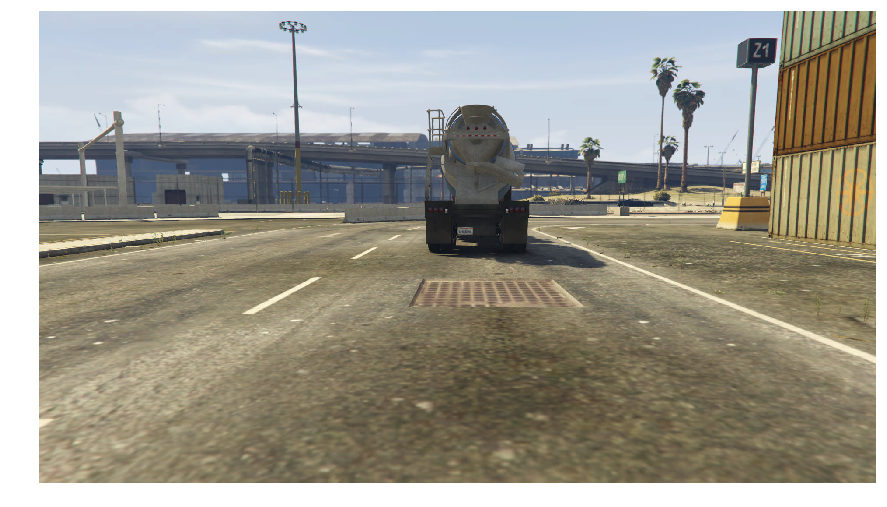

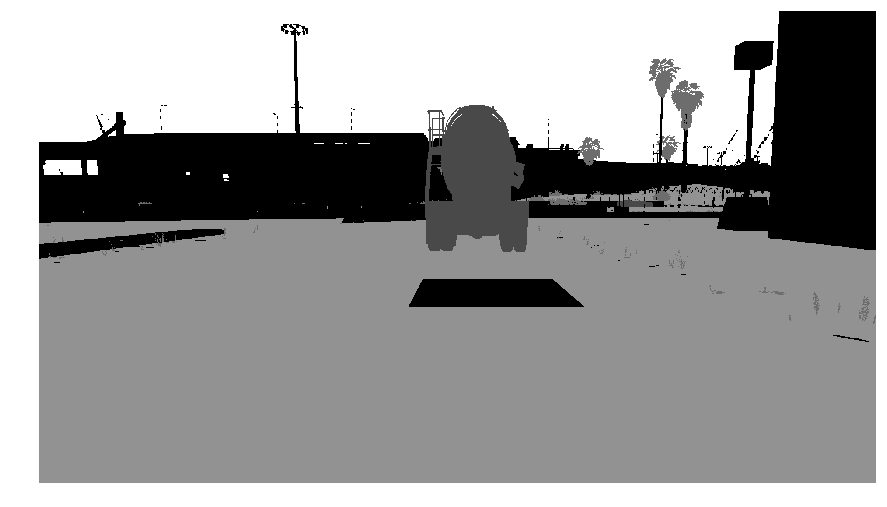

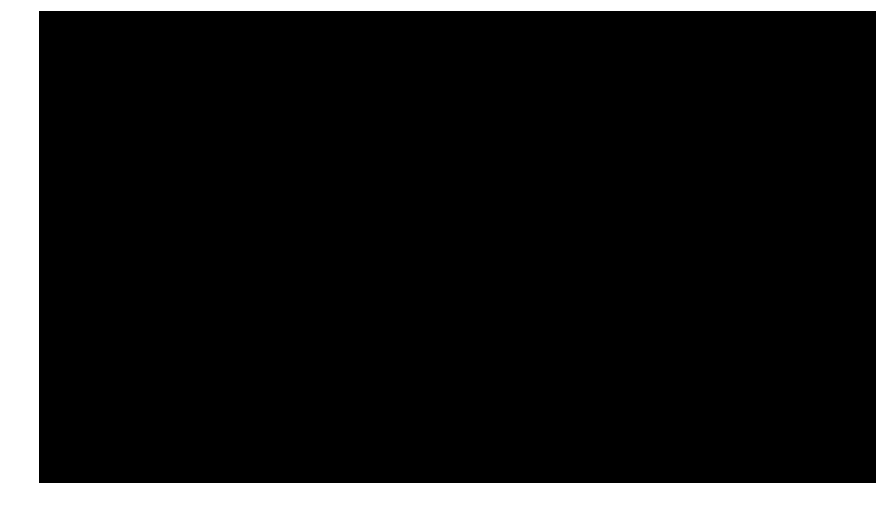

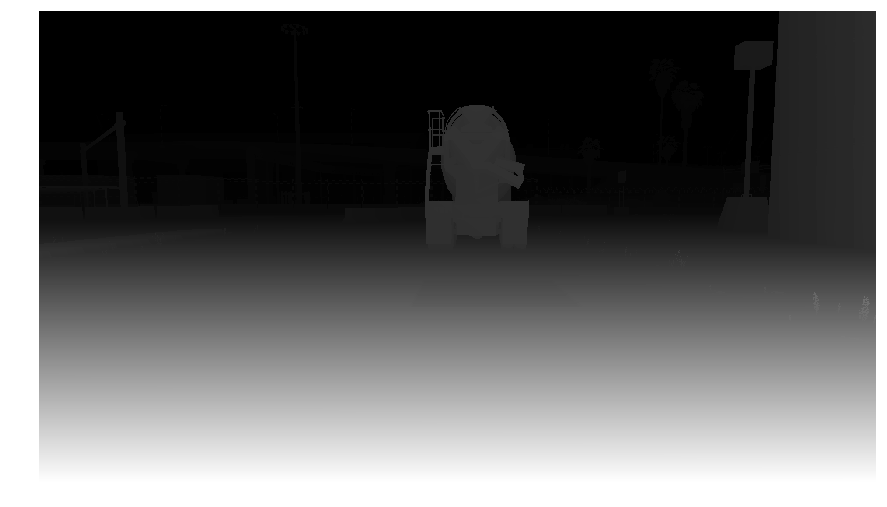

In [24]:
# name = 'info-2017-12-14--03-25-44--685'
TIFF_DIR = 'D:/GTAV_extraction_output'
# name = 'info-2017-11-24--17-10-27--469'
name = '2018-01-25--17-05-56--659'
# name = 'info-2017-12-14--00-42-14--323'
# TIFF_DIR = 'D:\projekty\GTA-V-extractors\GTAVisionExport_postprocessing\images'
im = Image.open(os.path.join(TIFF_DIR, name + '.tiff'))
size = (im.size[1], im.size[0])
import visualization
visualization.multi_page = False
# visualization.ini_file = 'gta-postprocessing.local.ini'
visualization.ini_file = 'gta-postprocessing.ini'

depth = load_depth(name)
stencil_ids = load_stencil_ids(name)
stencil_flags = load_stencil_flags(name)

fig = plt.figure(figsize=(15,15))
plt.axis('off')
plt.imshow(im)
# show_bounding_boxes(name, size, plt.gca())

fig = plt.figure(figsize=(15,15))
plt.axis('off')
plt.imshow(ids_to_greyscale(stencil_ids), cmap='gray')

fig = plt.figure(figsize=(15,15))
plt.axis('off')
plt.imshow(ids_to_greyscale(stencil_flags), cmap='gray')

fig = plt.figure(figsize=(15,15))
plt.axis('off')
 # plt.gca().set_title('depth')
plt.imshow(depth, cmap='gray')
# plt.draw()
plt.show()


In [6]:
np.unique(stencil_flags)
stencil_ids.shape[0], stencil_ids.shape[1]

(692, 1274)

#### showing and saving all stencil ids seperated

In [3]:
for i in range(0, 16):
    fig = plt.figure(figsize=(15, 15))
    plt.axis('off')
    plt.tick_params(axis='both', left='off', top='off', right='off', bottom='off', labelleft='off', labeltop='off',
                    labelright='off', labelbottom='off')
    plt.imshow(stencil_ids == i, cmap='Greys')
    plt.savefig(os.path.join('D:\postprocessing_output', 'stencil-3-{}.png'.format(i)), bbox_inches='tight', pad_inches=0)


#### showing and saving all stencil ids over image separated

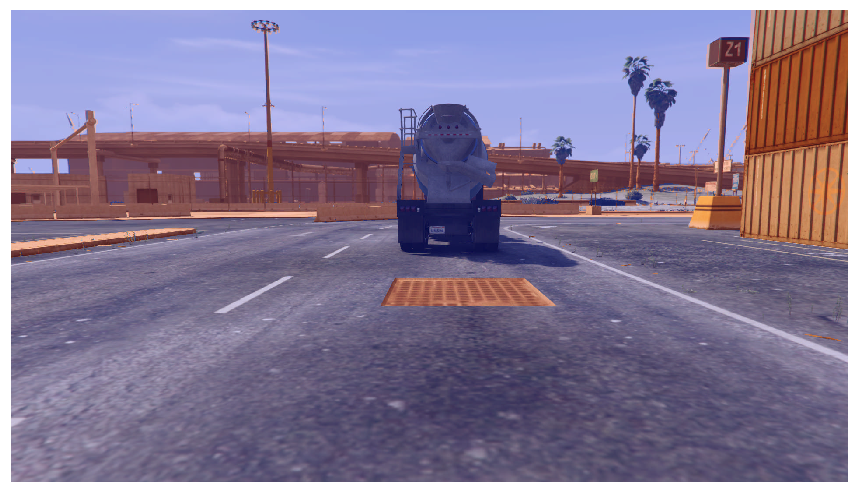

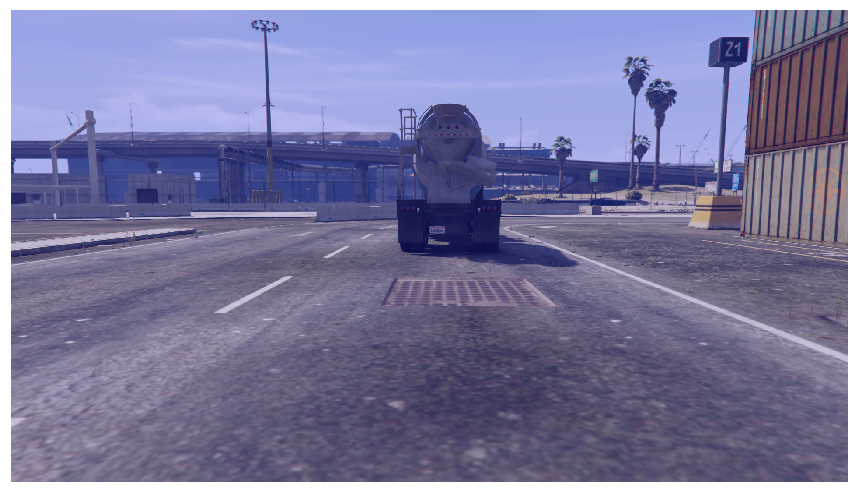

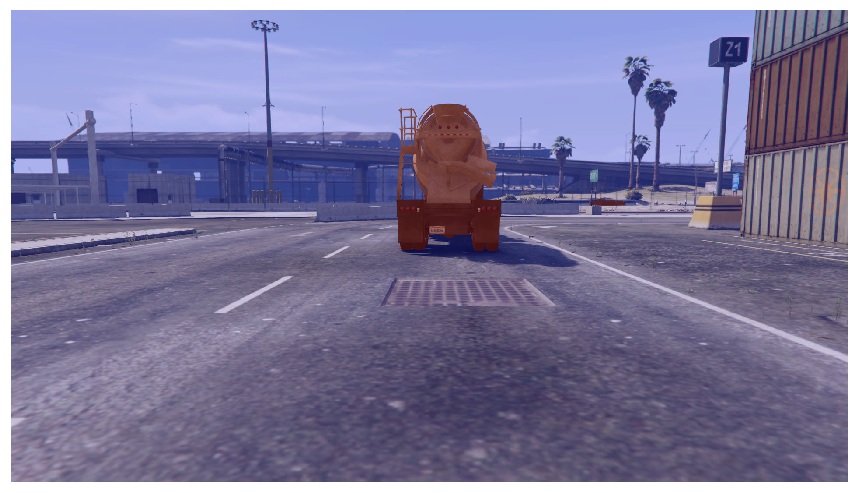

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


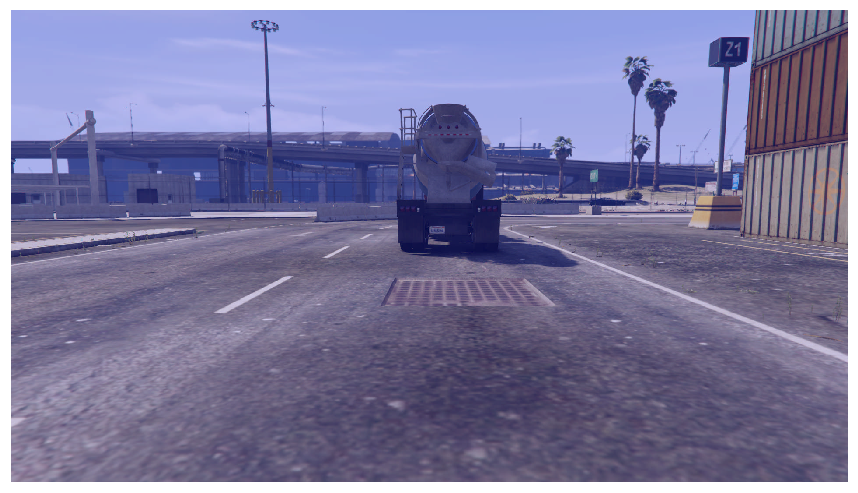

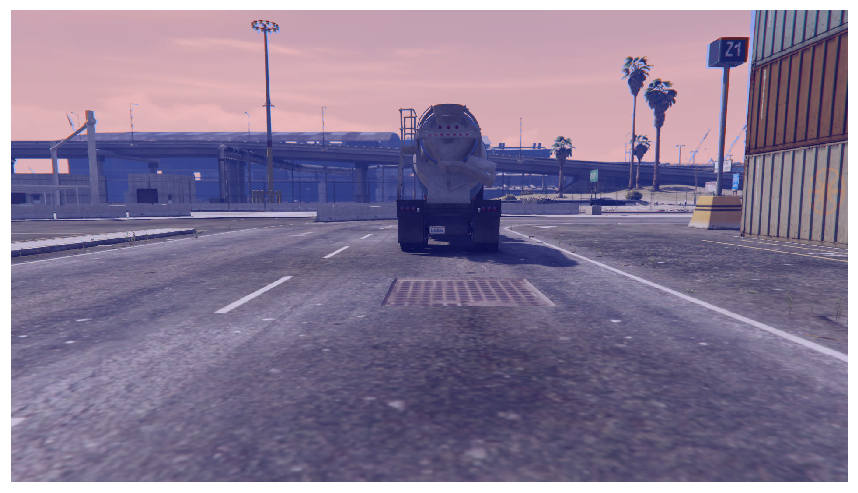

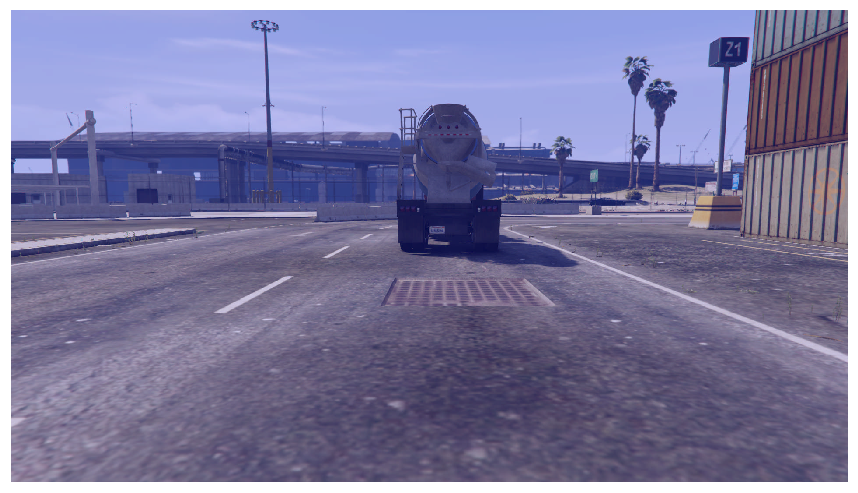

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


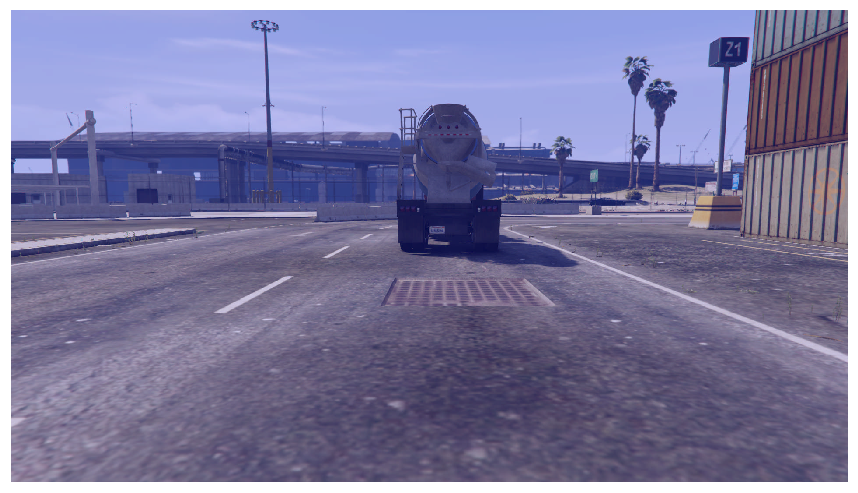

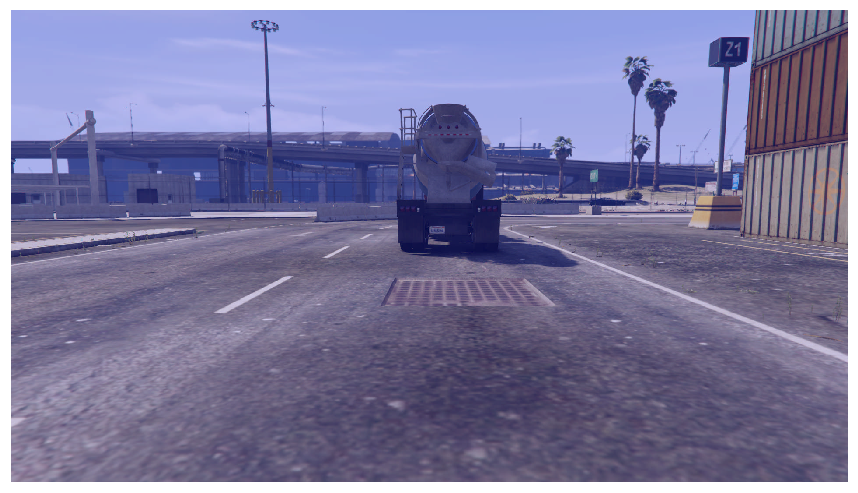

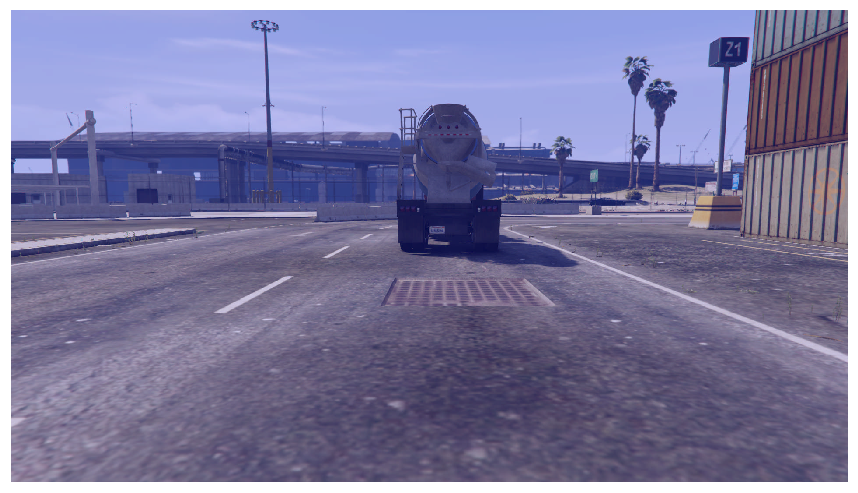

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [25]:
for i in range(0, 16):
    fig = plt.figure(figsize=(15, 15))
    plt.axis('off')
    plt.tick_params(axis='both', left='off', top='off', right='off', bottom='off', labelleft='off', labeltop='off',
                    labelright='off', labelbottom='off')
    plt.imshow(im)
    plt.imshow(stencil_ids == i, cmap='bwr', alpha=.2)
    # plt.savefig(os.path.join('D:\postprocessing_output', 'stencil-mesh-3-{}.png'.format(i)), bbox_inches='tight', pad_inches=0)
plt.show()

#### drawing one stencil over RGB image

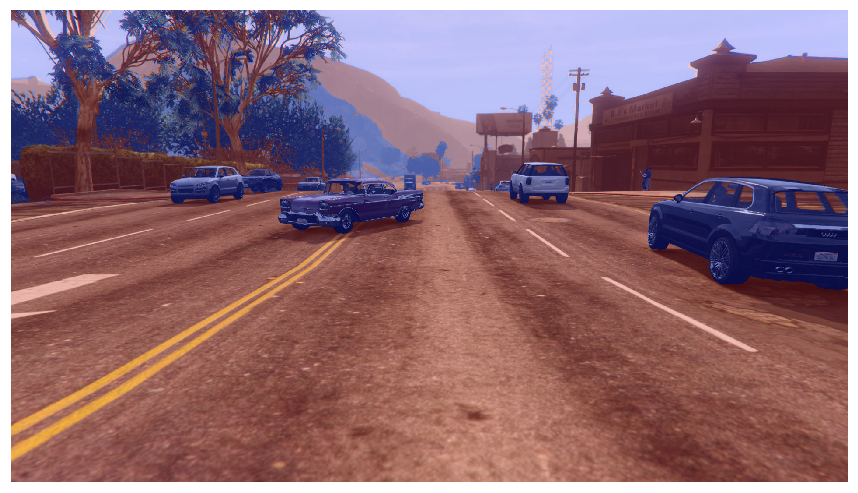

In [83]:
fig = plt.figure(figsize=(15, 15))
plt.axis('off')
plt.tick_params(axis='both', left='off', top='off', right='off', bottom='off', labelleft='off', labeltop='off',
                    labelright='off', labelbottom='off')
plt.imshow(im)
plt.imshow(stencil_ids == 0, cmap='bwr', alpha=.2)


#### showing depth over image

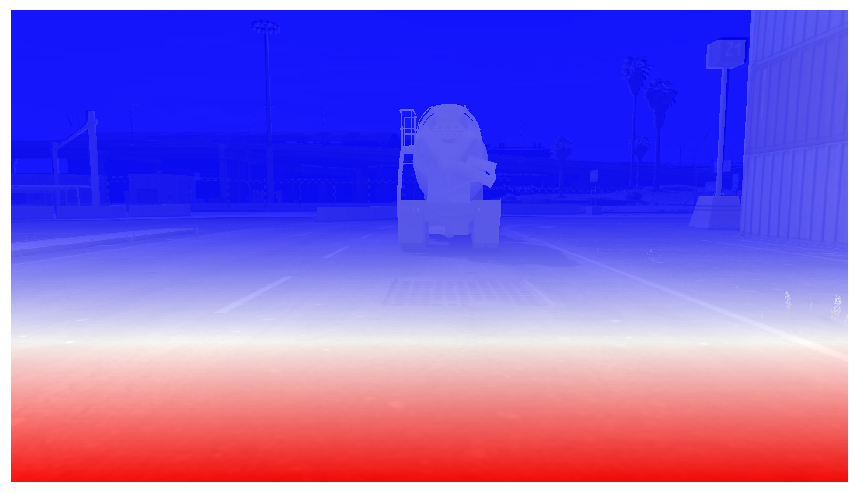

In [29]:
fig = plt.figure(figsize=(15, 15))
plt.axis('off')
plt.tick_params(axis='both', left='off', top='off', right='off', bottom='off', labelleft='off', labeltop='off',
                    labelright='off', labelbottom='off')
plt.imshow(im)
plt.imshow(depth, cmap='bwr', alpha=.9)
plt.show()

#### showing stencil over depth

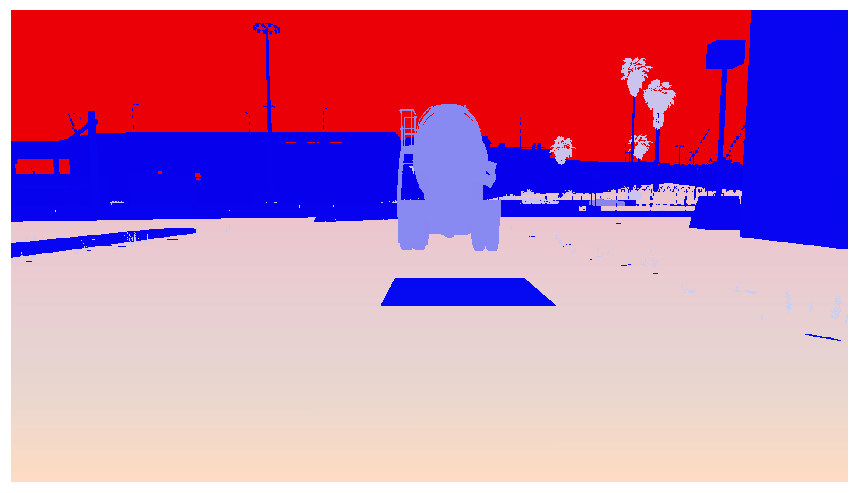

In [30]:
fig = plt.figure(figsize=(15, 15))
plt.axis('off')
plt.tick_params(axis='both', left='off', top='off', right='off', bottom='off', labelleft='off', labeltop='off',
                    labelright='off', labelbottom='off')
plt.imshow(depth)
plt.imshow(stencil_ids, cmap='bwr', alpha=.9)
plt.show()

In [57]:
np.nonzero(stencil_ids == 0)

(array([   0,    0,    0, ..., 1079, 1079, 1079], dtype=int64),
 array([   0,    1,    2, ..., 1911, 1912, 1913], dtype=int64))

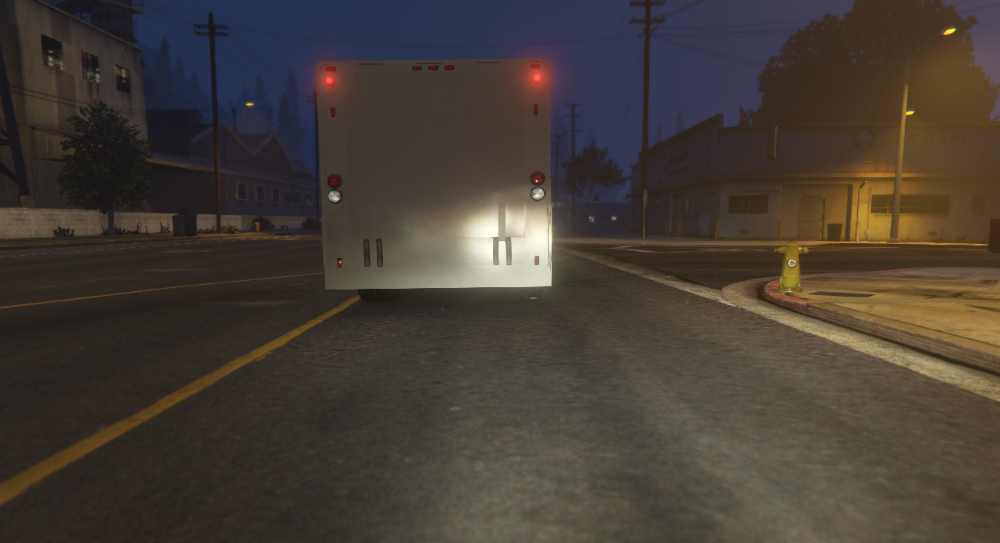

In [3]:
im

#### showing stencil flags

10000
100000
1000000
10000000


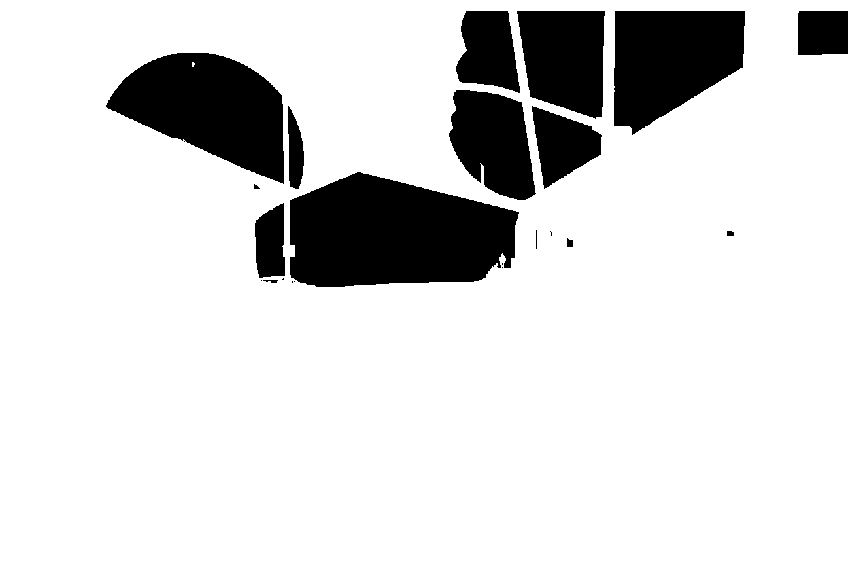

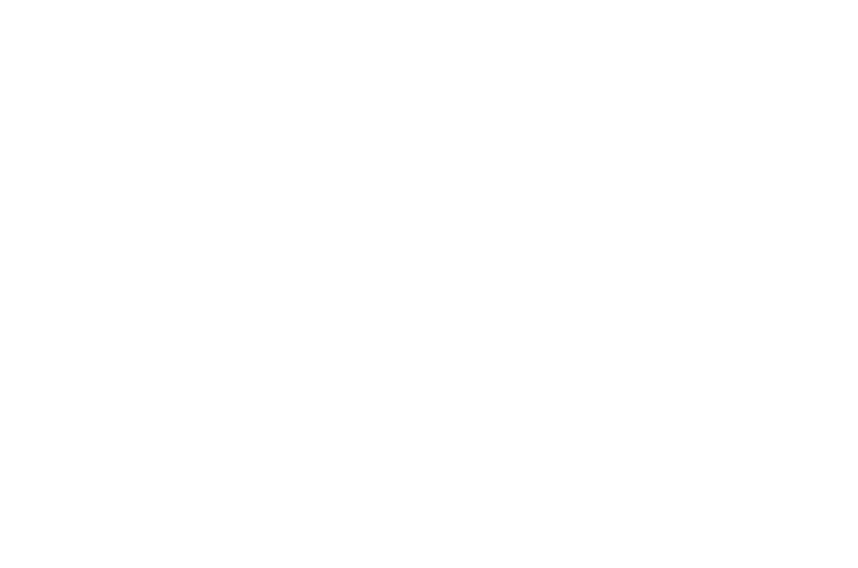

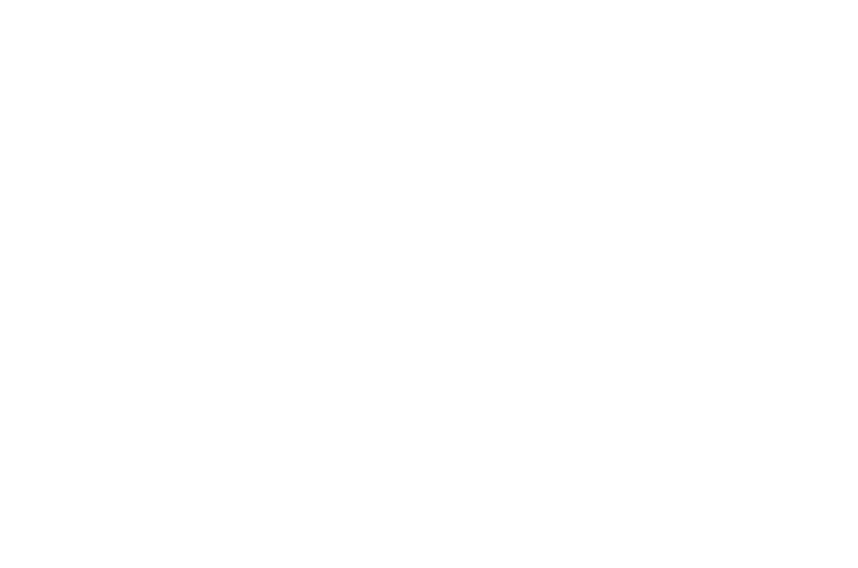

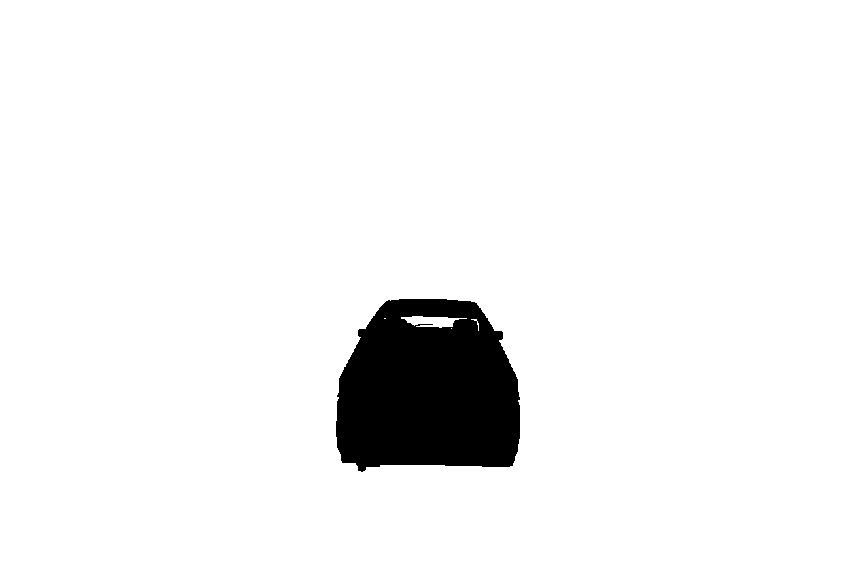

In [21]:
for i in [2**4, 2**5, 2**6, 2**7]:
    print("{0:b}".format(i))
    fig = plt.figure(figsize=(15, 15))
    plt.axis('off')
    plt.tick_params(axis='both', left='off', top='off', right='off', bottom='off', labelleft='off', labeltop='off',
                    labelright='off', labelbottom='off')
    plt.imshow(stencil_flags == i, cmap='Greys')
    # plt.imshow(im)
    # plt.imshow(stencil_flags == i, cmap='bwr', alpha=.2)

plt.show()